# Trabajo Academico Final
https://www.kaggle.com/datasets/zahidmughal2343/global-cancer-patients-2015-2024

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3 as sql
import seaborn as sns
import pygwalker as pyg
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource, HoverTool

In [2]:
#Leer data del csv
database_csv = pd.read_csv("./data/global_cancer_patients_2015_2024.csv")

In [3]:
#Leer data de un databse de sqlite
conn = sql.connect('./data/global_cancer_patients.db')
cursor = conn.cursor()

cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
tables = cursor.fetchall()
print("Tablas:", tables)

command2 = "PRAGMA table_info(patients);"
#conseguir atributos del dataset 
cursor.execute(command2)  
properties = cursor.fetchall()
print(properties)

cursor.execute("SELECT * FROM patients")  
#Conseguir todos los pacientes
rows = cursor.fetchall()
for row in rows[0:10]:
    print(row)


command2 = "SELECT Treatment_Cost_USD FROM patients"
#conseguir informacion por ejemplo de los pacientes 
cursor.execute(command2)  
cost = cursor.fetchall()
print("Primeros 10 costos de los pacientes ")
for row in cost[0:10]:
    print(row)

conn.close()

Tablas: [('patients',)]
[(0, 'Patient_ID', 'TEXT', 0, None, 0), (1, 'Age', 'TEXT', 0, None, 0), (2, 'Gender', 'TEXT', 0, None, 0), (3, 'Country_Region', 'TEXT', 0, None, 0), (4, 'Year', 'TEXT', 0, None, 0), (5, 'Genetic_Risk', 'TEXT', 0, None, 0), (6, 'Air_Pollution', 'TEXT', 0, None, 0), (7, 'Alcohol_Use', 'TEXT', 0, None, 0), (8, 'Smoking', 'TEXT', 0, None, 0), (9, 'Obesity_Level', 'TEXT', 0, None, 0), (10, 'Cancer_Type', 'TEXT', 0, None, 0), (11, 'Cancer_Stage', 'TEXT', 0, None, 0), (12, 'Treatment_Cost_USD', 'TEXT', 0, None, 0), (13, 'Survival_Years', 'TEXT', 0, None, 0), (14, 'Target_Severity_Score', 'TEXT', 0, None, 0)]
('PT0000000', '71', 'Male', 'UK', '2021', '6.4', '2.8', '9.5', '0.9', '8.7', 'Lung', 'Stage III', '62913.44', '5.9', '4.92')
('PT0000001', '34', 'Male', 'China', '2021', '1.3', '4.5', '3.7', '3.9', '6.3', 'Leukemia', 'Stage 0', '12573.41', '4.7', '4.65')
('PT0000002', '80', 'Male', 'Pakistan', '2023', '7.4', '7.9', '2.4', '4.7', '0.1', 'Breast', 'Stage II', '6984.

In [4]:
database_sql = pd.DataFrame(rows)
database_sql

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,PT0000000,71,Male,UK,2021,6.4,2.8,9.5,0.9,8.7,Lung,Stage III,62913.44,5.9,4.92
1,PT0000001,34,Male,China,2021,1.3,4.5,3.7,3.9,6.3,Leukemia,Stage 0,12573.41,4.7,4.65
2,PT0000002,80,Male,Pakistan,2023,7.4,7.9,2.4,4.7,0.1,Breast,Stage II,6984.33,7.1,5.84
3,PT0000003,40,Male,UK,2015,1.7,2.9,4.8,3.5,2.7,Colon,Stage I,67446.25,1.6,3.12
4,PT0000004,43,Female,Brazil,2017,5.1,2.8,2.3,6.7,0.5,Skin,Stage III,77977.12,2.9,3.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,PT0049995,80,Male,Pakistan,2023,2.3,7.5,2.8,3.8,2.9,Leukemia,Stage 0,71463.7,1.0,3.63
49996,PT0049996,40,Female,USA,2018,6.4,3.5,2.9,9.0,9.8,Colon,Stage I,49619.66,0.4,6.03
49997,PT0049997,74,Male,Pakistan,2015,6.2,1.6,8.7,4.7,4.0,Breast,Stage 0,5338.25,2.7,6.02
49998,PT0049998,21,Male,Brazil,2018,4.0,6.5,7.6,8.6,8.1,Liver,Stage IV,45100.47,7.5,6.54


In [5]:
# Los datos voy a trabajar con los datos de csv, porque se hacen más fáciles de manejar, pero voy a hacer un ejemplo consiguiendo los datos de la base de datos

In [6]:
# Un buen primer paso es visualizar los datos, para eso vamos a utilziar pygwalker que es una muy buena herramienta para ver los datos, dentro de las visualizaciones aumente un par de grafos que los explicare en el documento

In [7]:
pyg.walk(database_csv, spec="./pygwalker_files/pygwalker_spec_1748186003858.json",)

Box(children=(HTML(value='\n<div id="ifr-pyg-000636593ca86276OQri03b92IjSfcdX" style="height: auto">\n    <hea…

In [8]:
#Ahora si vamos analyzar los datos con pyplot, cada uno de ellos es de un paciente que tiene cacer y voy a hacer varios grafos
database_csv

,Patient_ID,Age,Gender,Country_Region,Year,Genetic_Risk,Air_Pollution,Alcohol_Use,Smoking,Obesity_Level,Cancer_Type,Cancer_Stage,Treatment_Cost_USD,Survival_Years,Target_Severity_Score
0,PT0000000,71,Male,UK,2021,6.4,2.8,9.5,0.9,8.7,Lung,Stage III,62913.44,5.9,4.92
1,PT0000001,34,Male,China,2021,1.3,4.5,3.7,3.9,6.3,Leukemia,Stage 0,12573.41,4.7,4.65
2,PT0000002,80,Male,Pakistan,2023,7.4,7.9,2.4,4.7,0.1,Breast,Stage II,6984.33,7.1,5.84
3,PT0000003,40,Male,UK,2015,1.7,2.9,4.8,3.5,2.7,Colon,Stage I,67446.25,1.6,3.12
4,PT0000004,43,Female,Brazil,2017,5.1,2.8,2.3,6.7,0.5,Skin,Stage III,77977.12,2.9,3.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,PT0049995,80,Male,Pakistan,2023,2.3,7.5,2.8,3.8,2.9,Leukemia,Stage 0,71463.70,1.0,3.63
49996,PT0049996,40,Female,USA,2018,6.4,3.5,2.9,9.0,9.8,Colon,Stage I,49619.66,0.4,6.03
49997,PT0049997,74,Male,Pakistan,2015,6.2,1.6,8.7,4.7,4.0,Breast,Stage 0,5338.25,2.7,6.02
49998,PT0049998,21,Male,Brazil,2018,4.0,6.5,7.6,8.6,8.1,Liver,Stage IV,45100.47,7.5,6.54


In [9]:
#Primero voy a eliminar ciertos datos, como el PATIENT_ID, que no me sirve de nada
database_clean = database_csv.loc[:,database_csv.columns != "Patient_ID"]
database_clean = database_clean.loc[:,database_clean.columns != "Country_Region"]
database_clean = database_clean.loc[:,database_clean.columns != "Year"]
database_clean

,Age,Gender,Genetic_Risk,Air_Pollution,Alcohol_Use,Smoking,Obesity_Level,Cancer_Type,Cancer_Stage,Treatment_Cost_USD,Survival_Years,Target_Severity_Score
0,71,Male,6.4,2.8,9.5,0.9,8.7,Lung,Stage III,62913.44,5.9,4.92
1,34,Male,1.3,4.5,3.7,3.9,6.3,Leukemia,Stage 0,12573.41,4.7,4.65
2,80,Male,7.4,7.9,2.4,4.7,0.1,Breast,Stage II,6984.33,7.1,5.84
3,40,Male,1.7,2.9,4.8,3.5,2.7,Colon,Stage I,67446.25,1.6,3.12
4,43,Female,5.1,2.8,2.3,6.7,0.5,Skin,Stage III,77977.12,2.9,3.62
...,...,...,...,...,...,...,...,...,...,...,...,...
49995,80,Male,2.3,7.5,2.8,3.8,2.9,Leukemia,Stage 0,71463.70,1.0,3.63
49996,40,Female,6.4,3.5,2.9,9.0,9.8,Colon,Stage I,49619.66,0.4,6.03
49997,74,Male,6.2,1.6,8.7,4.7,4.0,Breast,Stage 0,5338.25,2.7,6.02
49998,21,Male,4.0,6.5,7.6,8.6,8.1,Liver,Stage IV,45100.47,7.5,6.54


# 

In [10]:
#Preprocessing of data
def get_categories( column ):
    labels = database_clean[column].value_counts().index
    return dict(zip(labels,range(len(labels))))

#Change categorical_columns for values for that category
categorical_columns = set(database_clean.columns)-set(database_clean._get_numeric_data().columns)
database_clean = database_clean.copy()
for col in categorical_columns:
    category = get_categories(col)
    database_clean[col] = database_clean[col].replace(category)
database_clean

,Age,Gender,Genetic_Risk,Air_Pollution,Alcohol_Use,Smoking,Obesity_Level,Cancer_Type,Cancer_Stage,Treatment_Cost_USD,Survival_Years,Target_Severity_Score
0,71,0,6.4,2.8,9.5,0.9,8.7,7,2,62913.44,5.9,4.92
1,34,0,1.3,4.5,3.7,3.9,6.3,2,4,12573.41,4.7,4.65
2,80,0,7.4,7.9,2.4,4.7,0.1,6,0,6984.33,7.1,5.84
3,40,0,1.7,2.9,4.8,3.5,2.7,0,1,67446.25,1.6,3.12
4,43,1,5.1,2.8,2.3,6.7,0.5,4,2,77977.12,2.9,3.62
...,...,...,...,...,...,...,...,...,...,...,...,...
49995,80,0,2.3,7.5,2.8,3.8,2.9,2,4,71463.70,1.0,3.63
49996,40,1,6.4,3.5,2.9,9.0,9.8,0,1,49619.66,0.4,6.03
49997,74,0,6.2,1.6,8.7,4.7,4.0,6,4,5338.25,2.7,6.02
49998,21,0,4.0,6.5,7.6,8.6,8.1,3,3,45100.47,7.5,6.54


In [11]:
# Tenemos una categoría que se llama Target_Severity_Score, que nos dice cual es la severidad del cancer, en mientras mal alto sea el pronostico es peor
database_features = database_clean.loc[:,database_clean.columns != "Target_Severity_Score"]
database_features

,Age,Gender,Genetic_Risk,Air_Pollution,Alcohol_Use,Smoking,Obesity_Level,Cancer_Type,Cancer_Stage,Treatment_Cost_USD,Survival_Years
0,71,0,6.4,2.8,9.5,0.9,8.7,7,2,62913.44,5.9
1,34,0,1.3,4.5,3.7,3.9,6.3,2,4,12573.41,4.7
2,80,0,7.4,7.9,2.4,4.7,0.1,6,0,6984.33,7.1
3,40,0,1.7,2.9,4.8,3.5,2.7,0,1,67446.25,1.6
4,43,1,5.1,2.8,2.3,6.7,0.5,4,2,77977.12,2.9
...,...,...,...,...,...,...,...,...,...,...,...
49995,80,0,2.3,7.5,2.8,3.8,2.9,2,4,71463.70,1.0
49996,40,1,6.4,3.5,2.9,9.0,9.8,0,1,49619.66,0.4
49997,74,0,6.2,1.6,8.7,4.7,4.0,6,4,5338.25,2.7
49998,21,0,4.0,6.5,7.6,8.6,8.1,3,3,45100.47,7.5


In [12]:
# Ahora vamos a comenzar a hacer unos graficos, primero, veamos los atributos que tenemos
print(database_features.columns)

Index(['Age', 'Gender', 'Genetic_Risk', 'Air_Pollution', 'Alcohol_Use',
       'Smoking', 'Obesity_Level', 'Cancer_Type', 'Cancer_Stage',
       'Treatment_Cost_USD', 'Survival_Years'],
      dtype='object')


In [13]:
database_severity = database_clean.loc[:,database_clean.columns == "Target_Severity_Score"]
database_severity

,Target_Severity_Score
0,4.92
1,4.65
2,5.84
3,3.12
4,3.62
...,...
49995,3.63
49996,6.03
49997,6.02
49998,6.54


In [14]:
def get_colors(n):
    colors = [
        'red', 'green', 'blue', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan', '#1f77b4',  '#ff7f0e',  '#2ca02c',  '#d62728',  '#9467bd',  '#8c564b',  '#e377c2',  '#7f7f7f',  '#bcbd22', '#17becf',  '#aqua', '#fuchsia', '#gold', '#indigo', '#lime', '#maroon', '#navy', '#teal', '#violet'
    ]
    assert(n>0)
    return colors[:n]

<Axes: title={'center': 'Distribución de género'}, ylabel='count'>

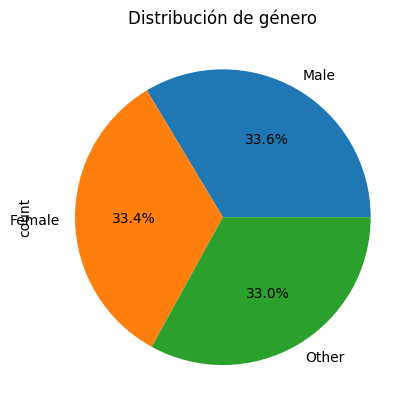

In [15]:
#Para hacer los gráficos, voy a responder preguntas
#1. Como esta dividida la base de datos entre generos
plt.title("Distribución de género")
database_csv['Gender'].value_counts().plot.pie(autopct='%1.1f%%')

Cancer_Type
Colon       6376
Prostate    6308
Leukemia    6266
Liver       6249
Skin        6231
Cervical    6222
Breast      6189
Lung        6159
Name: count, dtype: int64


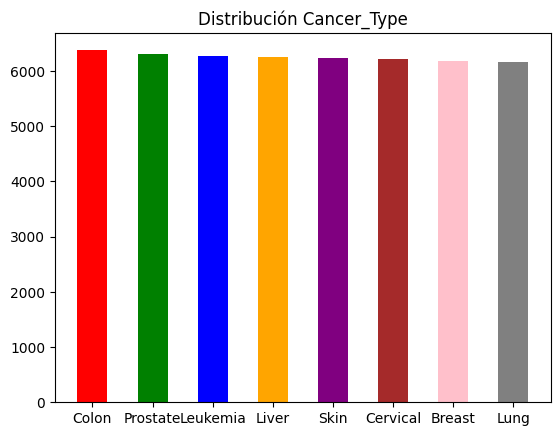

In [16]:
#2. Y los tipos de cancer? 
def count_values(col):
    plt.title(f"Distribución {col}")
    data = database_csv[col]
    categories = data.value_counts().index
    counts = data.value_counts().values
    plt.bar(categories, counts, width=0.5,color=get_colors(len(categories)))
    print(data.value_counts()) 
count_values("Cancer_Type")

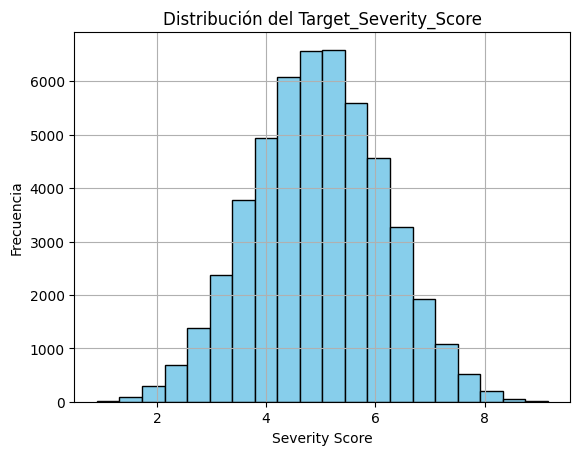

In [17]:
#La severidad del cancer como esta distribuida?
plt.hist(database_clean['Target_Severity_Score'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribución del Target_Severity_Score')
plt.xlabel('Severity Score')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()

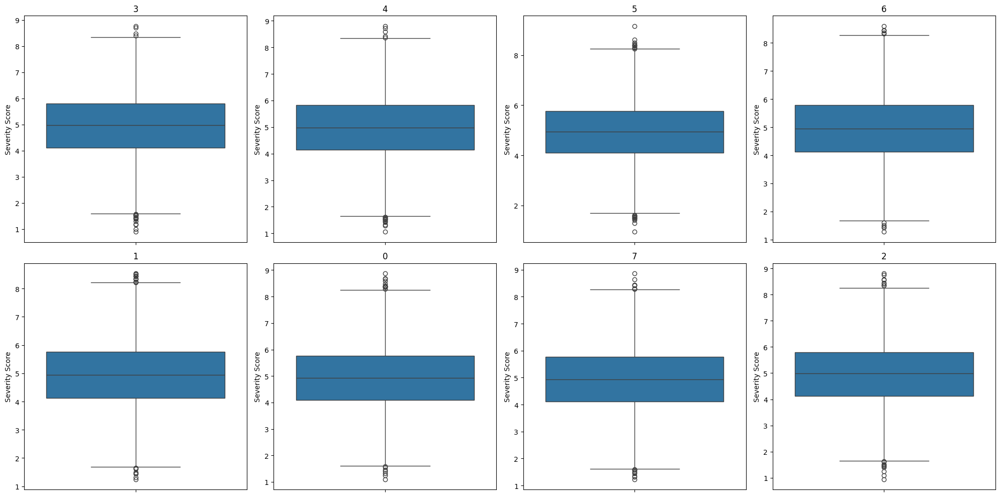

In [18]:
#Hay algunos tipos  de cancer que son más severos que otros en este database?
cancer_types = database_clean.sample(5000)['Cancer_Type'].unique()
cols = 4
rows = 2
fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
for i, cancer in enumerate(cancer_types):
    ax = axes[i // cols, i % cols]
    sns.boxplot(data=database_clean[database_clean['Cancer_Type'] == cancer],
            y='Target_Severity_Score', ax=ax)
    ax.set_title(f'{cancer}')
    ax.set_ylabel("Severity Score")
plt.tight_layout()
plt.savefig("./figures/img4.png")
plt.show()

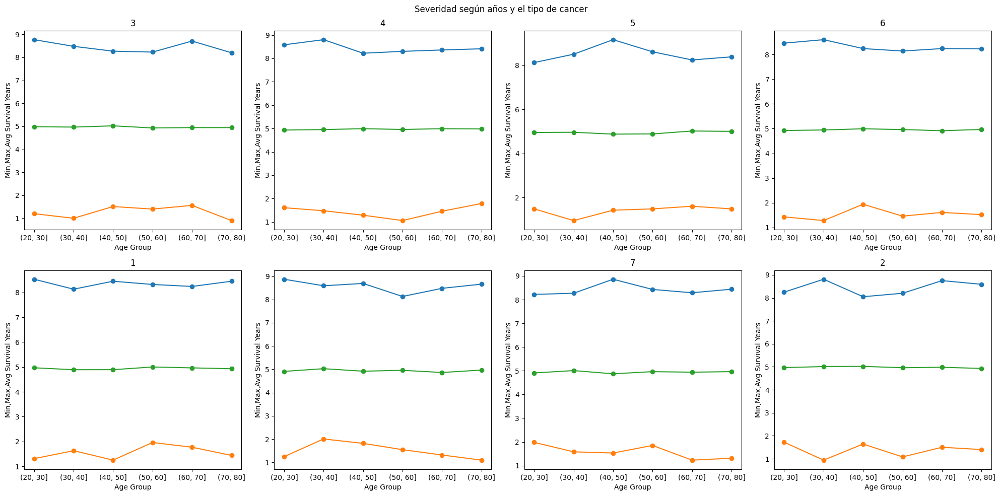

In [19]:
#Y para cada edad agrupada por decadas (de 20 a 30, de 30 a 40,...) la severidad aumenta?
database_clean['Age_Group'] = pd.cut(database_clean['Age'], bins=range(20, 90, 10))
fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
fig.suptitle("Severidad según años y el tipo de cancer")
for i, cancer in enumerate(cancer_types):
    ax = axes[i // cols, i % cols]
    subset = database_clean[database_clean['Cancer_Type'] == cancer]
    grouped = subset.groupby('Age_Group')['Target_Severity_Score'].max()
    grouped2 = subset.groupby('Age_Group')['Target_Severity_Score'].min()
    grouped3 = subset.groupby('Age_Group')['Target_Severity_Score'].mean()
    grouped.plot(ax=ax, marker='o', title=cancer)
    grouped2.plot(ax=ax, marker='o', title=cancer)
    grouped3.plot(ax=ax, marker='o', title=cancer)
    ax.set_xlabel('Age Group')
    ax.set_ylabel('Min,Max,Avg Survival Years')

plt.tight_layout()
plt.savefig("./figures/img5.png")
plt.show()

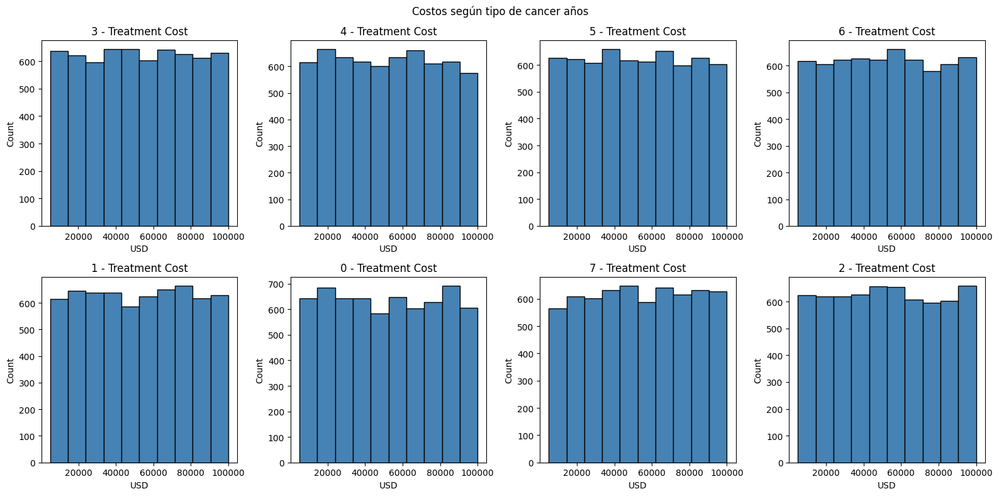

In [20]:
fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows))

fig.suptitle("Costos según tipo de cancer años")
for i, cancer in enumerate(cancer_types):
    ax = axes[i // cols, i % cols]
    subset = database_clean[database_clean['Cancer_Type'] == cancer]
    ax.hist(subset['Treatment_Cost_USD'], bins=10, color='steelblue', edgecolor='black')
    ax.set_title(f"{cancer} - Treatment Cost")
    ax.set_xlabel('USD')
    ax.set_ylabel('Count')

plt.tight_layout()
plt.savefig("./figures/img6.png")
plt.show()

In [21]:
output_notebook()

source = ColumnDataSource(database_csv)
p = figure(title="Obesidad vs Severidad", x_axis_label="Obesidad", y_axis_label="Severidad", width=700, height=400,y_range=(0, 10),)
p.circle(x='Obesity_Level', y='Target_Severity_Score', source=source, size=5, alpha=0.6)

hover = HoverTool(tooltips=[
    ("Obesidad", "@Obesity_Level"),
    ("Género", "@Gender"),
    ("Tipo Cáncer", "@Cancer_Type"),
    ("Severidad", "@Target_Severity_Score"),
])
p.add_tools(hover)

show(p)

Loading BokehJS ...

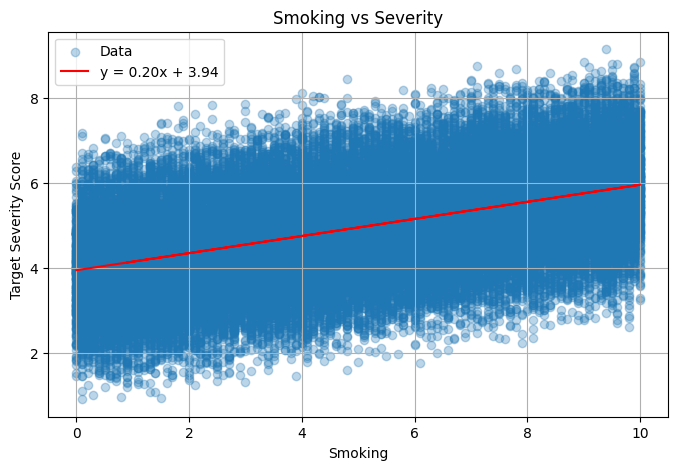

In [22]:
x = database_clean['Smoking']
y = database_clean['Target_Severity_Score']

m, y_i = np.polyfit(x, y, 1)
y_pred = m * x + y_i
plt.figure(figsize=(8, 5))
plt.scatter(x, y, alpha=0.3, label='Data')
plt.plot(x, y_pred, color='red', label=f'y = {m:.2f}x + {y_i:.2f}')
plt.title( 'Smoking vs Severity')
plt.xlabel('Smoking')
plt.ylabel('Target Severity Score')
plt.legend()
plt.grid(True)
plt.show()

In [23]:
#Modelo 
database_features.dtypes
database_features = database_features.iloc[:,database_features.columns!="Treatment_Cost_USD"]
database_features = database_features.iloc[:,database_features.columns!="Survival_Years"]
database_features = database_features.iloc[:,database_features.columns!="Caner_Stage"]
database_features 

,Age,Gender,Genetic_Risk,Air_Pollution,Alcohol_Use,Smoking,Obesity_Level,Cancer_Type,Cancer_Stage
0,71,0,6.4,2.8,9.5,0.9,8.7,7,2
1,34,0,1.3,4.5,3.7,3.9,6.3,2,4
2,80,0,7.4,7.9,2.4,4.7,0.1,6,0
3,40,0,1.7,2.9,4.8,3.5,2.7,0,1
4,43,1,5.1,2.8,2.3,6.7,0.5,4,2
...,...,...,...,...,...,...,...,...,...
49995,80,0,2.3,7.5,2.8,3.8,2.9,2,4
49996,40,1,6.4,3.5,2.9,9.0,9.8,0,1
49997,74,0,6.2,1.6,8.7,4.7,4.0,6,4
49998,21,0,4.0,6.5,7.6,8.6,8.1,3,3


In [24]:
database_severity.dtypes

Target_Severity_Score    float64
dtype: object

In [25]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(database_features, database_severity, test_size=0.2)

In [26]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_absolute_error

model = RandomForestRegressor(n_estimators=100)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
print(f"Error absoluto medio: {mae:.2f}")

/home/robdres/TrabajoAcademicoFinal/env/lib/python3.8/site-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Error absoluto medio: 0.49


In [31]:
print(len(database_csv.columns))
# Predecir
pred = model.predict([[23.0, 0.0, 10.0, 12.0, 42.0, 10.0, 12.0, 4, 1.0]])
print(f"Severidad estimada: {pred[0]:.2f}")

15
Severidad estimada: 8.33


/home/robdres/TrabajoAcademicoFinal/env/lib/python3.8/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [28]:
import joblib
joblib.dump(model, 'modelo_random_forest.pkl')

['modelo_random_forest.pkl']